# Benchmarks

## Cargar y distribuir

In [1]:
using SX, LazySets, Reachability, MAT
using Plots

INFO: Recompiling stale cache file C:\Users\bgarate\.julia\lib\v0.6\SX.ji for module SX.
INFO: Recompiling stale cache file C:\Users\bgarate\.julia\lib\v0.6\Reachability.ji for module Reachability.


In [2]:
PROC_NUMBER = 5

5

In [3]:
nprocs()

1

In [4]:
if(nprocs() < PROC_NUMBER)
    addprocs(PROC_NUMBER - nprocs())
end

4-element Array{Int64,1}:
 2
 3
 4
 5

In [5]:
@everywhere using SX, LazySets, Reachability, MAT

## Modelo ISS

Primero cargo el modelo

In [6]:
file = matopen("iss.mat")
A, B = sparse(read(file, "A")), read(file, "B");
C = Matrix(read(file, "C")[3, :]')
Cvec = C[1, :]
time_horizon = 20.0;
X0 = BallInf(zeros(size(A, 1)), 0.0001) # -0.0001 <= xi <= 0.0001 for all i
U = Hyperrectangle(low=[0.0, 0.8, 0.9], high=[0.1, 1., 1.]) # input set

S = ConstrainedLinearControlContinuousSystem(A, eye(A), nothing, ConstantInput(B * U));
problem_TV = InitialValueProblem(S, X0);

### Paralelo

In [32]:
sol = solve(problem_TV, :T=>20.0, :δ=>5e-3, :vars=> 1:270, :plot_vars=>[0, 270],
                        :projection_matrix=>C, :assume_sparse => true, :algorithm => "explicit_parallel",
                        :verbosity => 1);

[info] Time discretization...
[info] Parallel discretize
[info] Parallel discr_bloat_interpolation
[info] elapsed time: 0.618101558 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 0.020782986 seconds
[info] - Computing successors
[info] Using parallel execution for sparse case


Computing successors 100%|██████████████████████████████| Time: 0:02:06


[info] elapsed time: 126.311519421 seconds
[info] - Total
[info] elapsed time: 126.33353062 seconds
[info] Projection...
[info] elapsed time: 0.014028178 seconds


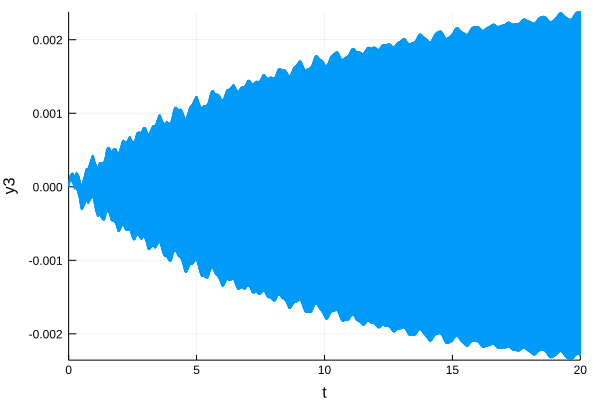

In [8]:
plot(sol, xlabel="t", ylabel="y3")

### Serial

In [33]:
sol = solve(problem_TV, :T=>20.0, :δ=>5e-3, :vars=> 1:270, :plot_vars=>[0, 270],
                        :projection_matrix=>C, :assume_sparse => true, :verbosity => 1);

[info] Time discretization...
[info] elapsed time: 0.732568982 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 0.066577323 seconds
[info] - Computing successors


Computing successors  97%|█████████████████████████████ |  ETA: 0:00:01

[info] elapsed time: 30.04985714 seconds
[info] - Total
[info] elapsed time: 30.117793592 seconds
[info] Projection...
[info] elapsed time: 0.018069102 seconds


Computing successors 100%|██████████████████████████████| Time: 0:00:30


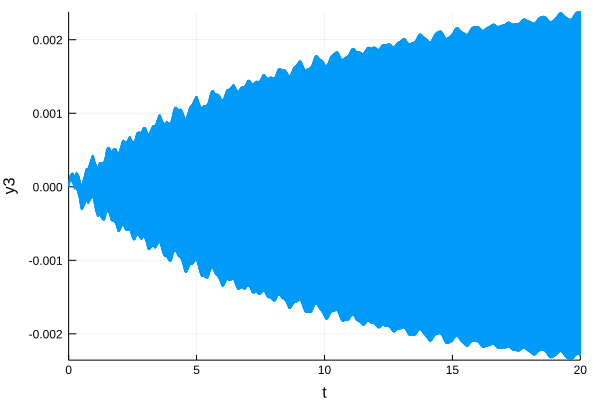

In [10]:
plot(sol, xlabel="t", ylabel="y3")

### Paralelo por octágonos

In [34]:
sol = solve(problem_TV, :T=>20.0, :δ=>5e-3, :vars=> 1:270, :plot_vars=>[0, 270],
                        :projection_matrix=>C, :assume_sparse => true, :algorithm => "explicit_parallel",
                        :template_directions => :oct, :ε => 0.00000000001, :set_type=>HPolygon,
                        :verbosity => 1);

[info] Time discretization...
[info] Parallel discretize
[info] Parallel discr_bloat_interpolation
[info] elapsed time: 0.578755704 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 0.025961684 seconds
[info] - Computing successors
[info] Using parallel execution for sparse case


Computing successors 100%|██████████████████████████████|  ETA: 0:00:01

[info] elapsed time: 447.579943074 seconds
[info] - Total
[info] elapsed time: 447.614699174 seconds
[info] Projection...


Computing successors 100%|██████████████████████████████| Time: 0:07:27


[info] elapsed time: 0.055368419 seconds


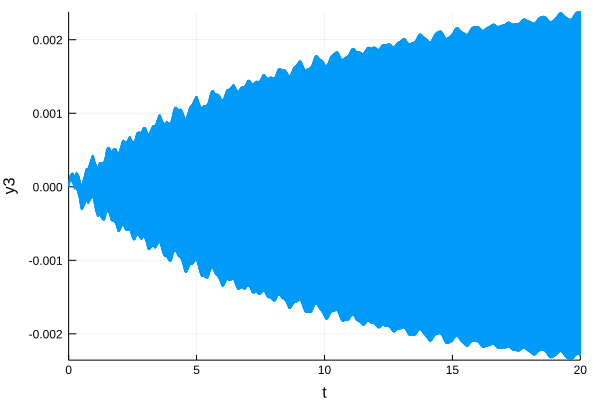

In [12]:
plot(sol, xlabel="t", ylabel="y3")

### Serial por octágonos

In [13]:
sol = solve(problem_TV, :T=>20.0, :δ=>5e-3, :vars=> 1:270, :plot_vars=>[0, 270],
                        :projection_matrix=>C, :assume_sparse => true,
                        :template_directions => :oct, :ε => 0.00000000001, :set_type=>HPolygon,
                        :verbosity => 1);

[info] Time discretization...
[info] elapsed time: 0.57500506 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 0.072263278 seconds
[info] - Computing successors


Computing successors 100%|██████████████████████████████|  ETA: 0:00:01

[info] elapsed time: 315.191758428 seconds
[info] - Total
[info] elapsed time: 315.265540927 seconds
[info] Projection...


Computing successors 100%|██████████████████████████████| Time: 0:05:15


[info] elapsed time: 0.060296587 seconds


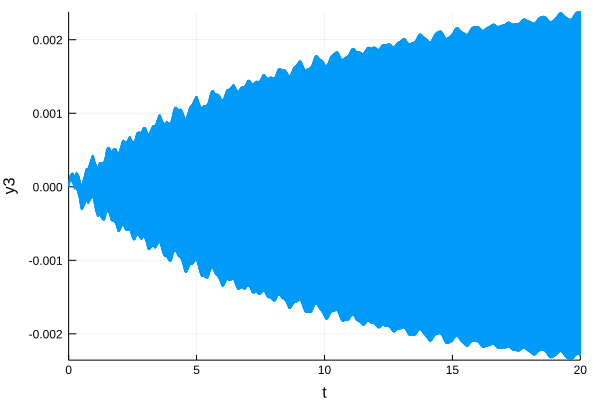

In [14]:
plot(sol, xlabel="t", ylabel="y3")

In [16]:
gc()

## Modelo MNA5

Primero cargo el modelo

In [17]:
#=
Model: MNA_5 (10913 variables, 9 inputs)
=#

mna5(o::Pair{Symbol, <:Any}...) = mna5(Options(Dict{Symbol, Any}(o)))

function mna5(input_options::Options)
    # =====================
    # Problem specification
    # =====================
    file = matopen("mna5.mat")
    A = sparse(read(file, "A"))

    # initial set:
    X0 = Hyperrectangle([fill(0.000225, 10); zeros(10903)],
                        [fill(0.000025, 10); zeros(10903)])

    # input set
    B = sparse(19:27, 1:9, fill(-1., 9), size(A, 1), 9)
    U = B * Hyperrectangle([fill(0.1, 5); fill(0.2, 4)], zeros(9))

    # instantiate continuous LTI system
    S = ContinuousSystem(A, X0, U)

    # property: x1 < 0.2 && x2 < 0.15
    property = LinearConstraintProperty([
        Clause([LinearConstraint(sparsevec([1], [1.0], 10913), 0.2)]),
        Clause([LinearConstraint(sparsevec([2], [1.0], 10913), 0.15)])])

    # =======================
    # Problem default options
    # =======================
    # 2D blocks except for the last block, which is 1D
    partition = vcat([(2*i-1:2*i) for i in 1:5456], [10913:10913])

    if input_options[:mode] == "reach"
        problem_options = Options(:vars => [1],
                                  :partition => partition,
                                  :plot_vars => [0, 1],
                                  :assume_sparse => true,
                                  :lazy_expm => true)

    elseif input_options[:mode] == "check"
        problem_options = Options(:vars => [1, 2],
                                  :partition => partition,
                                  :property => property,
                                  :assume_sparse => true,
                                  :lazy_expm => true)
    end

    return (S, merge(problem_options, input_options))
end

mna5 (generic function with 2 methods)

### Parallel

In [18]:
@time p, opts = mna5(:δ => 1e-3, :N => 3000, :mode=>"reach", :verbosity => 1, :algorithm => "explicit_parallel"); # warm-up

  0.764831 seconds (396.13 k allocations: 24.932 MiB, 1.13% gc time)


In [19]:
@time sol = solve(p, opts);

[info] Time discretization...
[info] Parallel discretize
[info] Parallel discr_bloat_interpolation
[info] elapsed time: 230.539335095 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 133.316893583 seconds
[info] - Computing successors
[info] Using parallel execution for lazy_expm sparse case
[info] AUsing parallel execution for lazy_expm sparse case
[info] BUsing parallel execution for lazy_expm sparse case
[info] CUsing parallel execution for lazy_expm sparse case


Computing successors 100%|██████████████████████████████| Time: 0:04:04


[info] elapsed time: 244.415536823 seconds
[info] - Total
[info] elapsed time: 377.997832758 seconds
[info] Projection...
[info] elapsed time: 0.290853859 seconds
609.409316 seconds (328.15 M allocations: 45.791 GiB, 0.88% gc time)


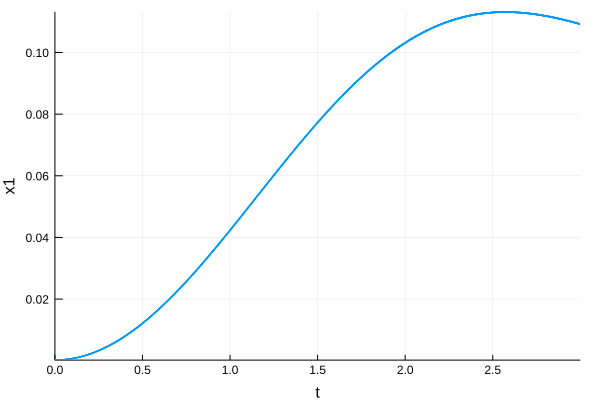

In [20]:
plot(sol)

### Serial

In [21]:
@time p, opts = mna5(:δ => 1e-3, :N => 3000, :mode=>"reach", :verbosity => 1); # warm-up

  0.069886 seconds (3.47 k allocations: 3.495 MiB, 5.31% gc time)


In [22]:
@time sol = solve(p, opts);

[info] Time discretization...
[info] elapsed time: 443.141464411 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 924.594643707 seconds
[info] - Computing successors


Computing successors  99%|██████████████████████████████|  ETA: 0:00:01

[info] elapsed time: 127.774759636 seconds
[info] - Total
[info] elapsed time: 1052.696315907 seconds
[info] Projection...
[info] elapsed time: 0.024547488 seconds
1495.864187 seconds (63.72 M allocations: 310.572 GiB, 1.12% gc time)


Computing successors 100%|██████████████████████████████| Time: 0:02:08


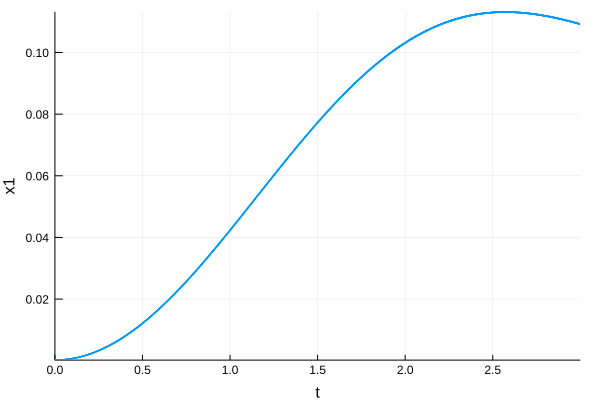

In [23]:
plot(sol)

### Parallel por octágonos

In [24]:
@time p, opts = mna5(:δ => 1e-3, :N => 3000, :mode=>"reach", :verbosity => 1, :algorithm => "explicit_parallel",
                            :template_directions => :oct, :ε => 0.00000000001, :set_type=>HPolygon); # warm-up

  0.021043 seconds (2.75 k allocations: 3.465 MiB, 34.05% gc time)


In [25]:
@time sol = solve(p, opts);

[info] Time discretization...
[info] Parallel discretize
[info] Parallel discr_bloat_interpolation
[info] elapsed time: 227.45992681 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 247.261475934 seconds
[info] - Computing successors
[info] Using parallel execution for lazy_expm sparse case
[info] AUsing parallel execution for lazy_expm sparse case
[info] BUsing parallel execution for lazy_expm sparse case
[info] CUsing parallel execution for lazy_expm sparse case


Computing successors 100%|██████████████████████████████| Time: 0:19:15


[info] elapsed time: 1155.002144632 seconds
[info] - Total
[info] elapsed time: 1402.371969536 seconds
[info] Projection...
[info] elapsed time: 1.098209646 seconds
1630.946267 seconds (2.82 G allocations: 95.367 GiB, 1.39% gc time)


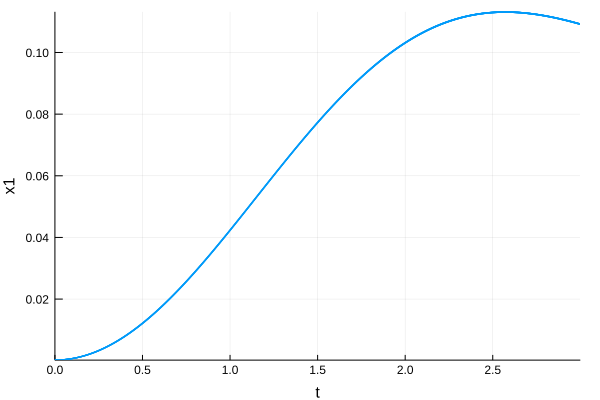

In [26]:
plot(sol)

### Serial por octágonos

In [27]:
@time p, opts = mna5(:δ => 1e-3, :N => 3000, :mode=>"reach", :verbosity => 1,
                            :template_directions => :oct, :ε => 0.00000000001, :set_type=>HPolygon); # warm-up

  0.014560 seconds (2.75 k allocations: 3.465 MiB, 33.05% gc time)


In [28]:
@time sol = solve(p, opts);

[info] Time discretization...
[info] elapsed time: 437.192310539 seconds
[info] Reachable States Computation...
[info] - Decomposing X0
[info] elapsed time: 1839.437731817 seconds
[info] - Computing successors


Computing successors 100%|██████████████████████████████|  ETA: 0:00:00

[info] elapsed time: 196.326283506 seconds
[info] - Total
[info] elapsed time: 2035.766076082 seconds
[info] Projection...


Computing successors 100%|██████████████████████████████| Time: 0:03:16


[info] elapsed time: 1.012810905 seconds
2473.973253 seconds (196.65 M allocations: 492.779 GiB, 1.18% gc time)


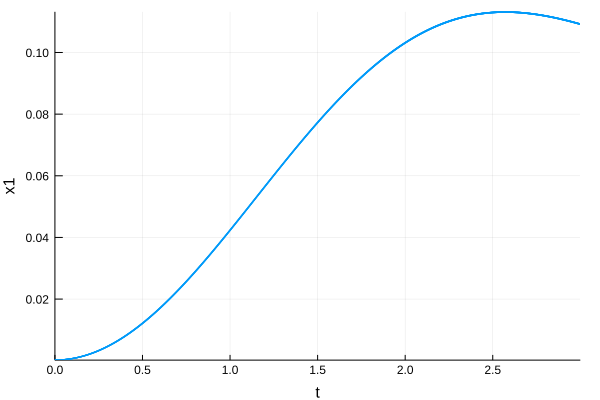

In [29]:
plot(sol)

In [30]:
procs()

5-element Array{Int64,1}:
 1
 2
 3
 4
 5